# Airline delays 
## Bureau of Transportation Statistics
https://www.transtats.bts.gov/DL_SelectFields.asp?Table_ID=236   
https://www.bts.gov/topics/airlines-and-airports/understanding-reporting-causes-flight-delays-and-cancellations

2015 - 2019

### Additional sources
This might be useful in matching station codes to airports:
1. http://dss.ucar.edu/datasets/ds353.4/inventories/station-list.html
2. https://www.world-airport-codes.com/

In [0]:
from pyspark.sql import functions as f
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType, NullType, ShortType, DateType, BooleanType, BinaryType
from pyspark.sql import SQLContext
from pyspark.sql import types
from pyspark.sql.functions import *
from datetime import datetime, timedelta

sqlContext = SQLContext(sc)


In [0]:
username = dbutils.notebook.entry_point.getDbutils().notebook().getContext().tags().apply('user')
userhome = 'dbfs:/user/' + username
final_project_path = userhome + "/FINAL_PROJECT/" 

In [0]:
FINAL_PROJECT_path_open = '/dbfs' + final_project_path.split(':')[-1] # for use with python open()
dbutils.fs.mkdirs(final_project_path)

Out[6]: True

In [0]:
display(dbutils.fs.ls("dbfs:/mnt/mids-w261/datasets_final_project/"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/allstate-claims-severity.zip,allstate-claims-severity.zip,51204863
dbfs:/mnt/mids-w261/datasets_final_project/dac.tar.gz,dac.tar.gz,4576820670
dbfs:/mnt/mids-w261/datasets_final_project/kdd-cup-2014-predicting-excitement-at-donors-choose.zip,kdd-cup-2014-predicting-excitement-at-donors-choose.zip,971133938
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/porto-seguro-safe-driver-prediction.zip,porto-seguro-safe-driver-prediction.zip,80247571
dbfs:/mnt/mids-w261/datasets_final_project/walmart-recruiting-trip-type-classification.zip,walmart-recruiting-trip-type-classification.zip,11510035
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0


In [0]:
display(dbutils.fs.ls("dbfs:/mnt/mids-w261/datasets_final_project/weather_data"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather-miss.parquet/,weather-miss.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2015a.parquet/,weather2015a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2016a.parquet/,weather2016a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2017a.parquet/,weather2017a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2018a.parquet/,weather2018a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2019a.parquet/,weather2019a.parquet/,0


### Pull airline data from parquet on dbfs

In [0]:
airlines = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/201*.parquet")
display(airlines.sample(False, 0.00001))

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2019,2,6,2,7,2019-06-02,B6,20409,B6,N296JB,1786,14122,1412202,30198,PIT,"Pittsburgh, PA",PA,42,Pennsylvania,23,10721,1072102,30721,BOS,"Boston, MA",MA,25,Massachusetts,13,1504,1458,-6.0,0.0,0.0,-1,1500-1559,10.0,1508,1620,6.0,1647,1626,-21.0,0.0,0.0,-2,1600-1659,0.0,null,0.0,103.0,88.0,72.0,1.0,496.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,2,6,13,4,2019-06-13,EV,20366,EV,N14148,4213,11618,1161802,31703,EWR,"Newark, NJ",NJ,34,New Jersey,21,14524,1452401,34524,RIC,"Richmond, VA",VA,51,Virginia,38,1505,1545,40.0,40.0,1.0,2,1500-1559,21.0,1606,1703,4.0,1649,1707,18.0,18.0,1.0,1,1600-1659,0.0,null,0.0,104.0,82.0,57.0,1.0,277.0,2,18.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,2,6,14,5,2019-06-14,9E,20363,9E,N8837B,3491,11203,1120302,30424,CWA,"Mosinee, WI",WI,55,Wisconsin,45,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,635,628,-7.0,0.0,0.0,-1,0600-0659,54.0,722,807,5.0,746,812,26.0,26.0,1.0,1,0700-0759,0.0,null,0.0,71.0,104.0,45.0,1.0,175.0,1,0.0,0.0,26.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2016,3,8,12,5,2016-08-12,AS,19930,AS,N768AS,50,10299,1029904,30299,ANC,"Anchorage, AK",AK,2,Alaska,1,14709,1470903,30073,SCC,"Deadhorse, AK",AK,2,Alaska,1,1455,1448,-7.0,0.0,0.0,-1,1400-1459,5.0,1453,1617,5.0,1637,1622,-15.0,0.0,0.0,-1,1600-1659,0.0,null,0.0,102.0,94.0,84.0,1.0,627.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2016,3,8,30,2,2016-08-30,UA,19977,UA,N487UA,683,10257,1025702,30257,ALB,"Albany, NY",NY,36,New York,22,13930,1393004,30977,ORD,"Chicago, IL",IL,17,Illinois,41,1740,1935,115.0,115.0,1.0,7,17

In [0]:
airlines.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: integer (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_AIRPORT_SEQ_ID: integer (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_SEQ_ID: integer (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_STATE_FIPS: integer (nullable = true)
-- DEST_STATE_NM: string (nullable = true)
-- DEST_WAC: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- WHEELS_ON: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- ARR_TIME: integer (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_DEL15: double (nullable = true)
-- ARR_DELAY_GROUP: integer (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- CANCELLED: double (nullable = true)
-- CANCELLATION_CODE: string (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_ARR_DELAY: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- DIV1_AIRPORT: string (nullable = true)
-- DIV1_AIRPORT_ID: integer (nullable = true)
-- DIV1_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV1_WHEELS_ON: integer (nullable = true)
-- DIV1_TOTAL_GTIME: double (nullable = true)
-- DIV1_LONGEST_GTIME: double (nullable = true)
-- DIV1_WHEELS_OFF: integer (nullable = true)
-- DIV1_TAIL_NUM: string (nullable = true)
-- DIV2_AIRPORT: string (nullable = true)
-- DIV2_AIRPORT_ID: integer (nullable = true)
-- DIV2_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV2_WHEELS_ON: integer (nullable = true)
-- DIV2_TOTAL_GTIME: double (nullable = true)
-- DIV2_LONGEST_GTIME: double (nullable = true)
-- DIV2_WHEELS_OFF: integer (nullable = true)
-- DIV2_TAIL_NUM: string (nullable = true)
-- DIV3_AIRPORT: string (nullable = true)
-- DIV3_AIRPORT_ID: integer (nullable = true)
-- DIV3_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV3_WHEELS_ON: integer (nullable = true)
-- DIV3_TOTAL_GTIME: double (nullable = true)
-- DIV3_LONGEST_GTIME: double (nullable = true)
-- DIV3_WHEELS_

In [0]:
f'{airlines.count():,}'

Out[8]: '31,746,841'

### Pull timezone reference chart from csv on dbfs

In [0]:
city_timezone = spark.read.option("header", "false").csv("dbfs:/FileStore/tables/cities1000-4.csv")

# Weather and Join Work
https://data.nodc.noaa.gov/cgi-bin/iso?id=gov.noaa.ncdc:C00532

#### Pulling and filtering data

In [0]:
#All Weather Files
display(dbutils.fs.ls("dbfs:/mnt/mids-w261/datasets_final_project/weather_data"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather-miss.parquet/,weather-miss.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2015a.parquet/,weather2015a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2016a.parquet/,weather2016a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2017a.parquet/,weather2017a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2018a.parquet/,weather2018a.parquet/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2019a.parquet/,weather2019a.parquet/,0


In [0]:
#All Weather Files
weather = spark.read.option("header", "true")\
                    .parquet(f"dbfs:/mnt/mids-w261/datasets_final_project/weather_data/*.parquet")

f'{weather.count():,}'

Out[20]: '630,904,436'

In [0]:
# WEATHER ONLY 2015
weather2015 = spark.read.option("header", "true")\
                    .parquet(f"dbfs:/mnt/mids-w261/datasets_final_project/weather_data/weather2015a.parquet")

f'{weather2015.count():,}'

Out[21]: '116,341,048'

In [0]:
def create_airport_code_stations(call_code):
    try:
      if call_code[0] == 'K':
        airport_code = call_code[1:4]
      else:
        airport_code = ''
    except:
      airport_code = ''
    return airport_code

create_airport_code_stations_udf = f.udf(create_airport_code_stations, types.StringType())
weather_q12015_coded = weather_q12015.withColumn("airport_code", create_airport_code_stations_udf('CALL_SIGN')) 

#### FILTER WEATHER TO Q1 2015. SAVE FILE TO DBFS

In [0]:
#FILTER on Q1 and Airport stations
weather_atl_ord_q12015 = weather2015.filter((weather2015_atl_ord.DATE <= "2015-03-31") & 
                            ((weather2015.NAME == "CHICAGO OHARE INTERNATIONAL AIRPORT, IL US") | \
                            (weather2015.NAME == "ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US")))
#WILL WANT TO TAKE OUT THE AIRPORT FILTER LATER SINCE WE NEED TO BRING IN WEATHER AT DESTINATION STATIONS AS WELL

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-4428713946972981> in <module> 
 1 #FILTER on Q1 and Airport stations 
 ----> 2 weather_atl_ord_q12015 = weather2015.filter((weather2015_atl_ord.DATE <= "2015-03-31") & 
 3 ((weather2015.NAME == "CHICAGO OHARE INTERNATIONAL AIRPORT, IL US") | \
 4 (weather2015.NAME == "ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US")))
 5 #WILL WANT TO TAKE OUT THE AIRPORT FILTER LATER SINCE WE NEED TO BRING IN WEATHER AT DESTINATION STATIONS AS WELL 

 NameError : name 'weather2015_atl_ord' is not defined

In [0]:
#SAVE FILE TO DBFS
weather_atl_ord_q12015.write.format("parquet").save(final_project_path + "weather_atl_ord_q1_2015.parquet")

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-4428713946973056> in <module> 
 1 #SAVE FILE TO DBFS 
 ----> 2 weather_atl_ord_q12015 . write . format ( "parquet" ) . save ( final_project_path + "weather_atl_ord_q1_2015.parquet" ) 

 /databricks/spark/python/pyspark/sql/readwriter.py in save (self, path, format, mode, partitionBy, **options) 
 825 self . _jwrite . save ( ) 
 826 else : 
 --> 827 self . _jwrite . save ( path ) 
 828 
 829 @ since ( 1.4 ) 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1303 answer = self . gateway_client . send_command ( command ) 
 1304 return_value = get_return_value(
 -> 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 
 1307 for temp_arg in temp_args : 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 131 # Hide where the exception came from that shows a non-Pythonic 
 132 # JVM exception message. 
 --> 133 raise_from ( converted ) 
 134 else : 
 135 raise 

 /databricks/spark/python/pyspark/sql/utils.py in raise_from (e) 

 AnalysisException : path dbfs:/user/stevendleung@ischool.berkeley.edu/FINAL_PROJECT/weather_atl_ord_q1_2015.parquet already exists.;

In [0]:
#FILTER on Q1
weather_q12015 = weather2015.filter(weather2015.DATE <= "2015-03-31")

##### Add Airport code to weather data

In [0]:
def create_airport_code_stations(call_code):
    try:
      if call_code[0] == 'K':
        airport_code = call_code[1:4]
      else:
        airport_code = ''
    except:
      airport_code = ''
    return airport_code

create_airport_code_stations_udf = f.udf(create_airport_code_stations, types.StringType())
weather_q12015_coded = weather_q12015.withColumn("airport_code", create_airport_code_stations_udf('CALL_SIGN')) 

In [0]:
#SAVE FILE TO DBFS
weather_q12015_coded.write.format("parquet").save(final_project_path + "weather_q12015_coded.parquet")

#### FILTER FLIGHTS TO Q1 2015, DEPARTING ORD AND ATL. SAVE FILE TO DBFS

In [0]:
#FILTER on Q1 and Airport stations
airlines_ATL_ORD_Q12015 = airlines.filter( (airlines.QUARTER  == 1) & (airlines.YEAR  == 2015) & \
               ((airlines.ORIGIN  == 'ORD') | (airlines.ORIGIN  == 'ATL')))

In [0]:
def split_city_name(city_state):
  '''UDF to deal with cases where dual cities are labeled
  with a "/". Returns only first city '''

  city = city_state.split(',')[0]
  state = city_state.split(',')[1]
  shortened_city = city.split('/')[0]
  
  return shortened_city + ',' + state

split_city_name_udf = f.udf(split_city_name, types.StringType())

airlines_ATL_ORD_Q12015_short_city = airlines_ATL_ORD_Q12015.withColumn("SHORT_DEST_CITY_NAME", split_city_name_udf('DEST_CITY_NAME'))

In [0]:
#SAVE FILE TO DBFS
airlines_ATL_ORD_Q12015_short_city.write.format("parquet").save(final_project_path + "airlines_ATL_ORD_Q12015_mod.parquet")

#### READ FROM SAVED FILES ---START FROM HERE---

In [0]:
weather_q12015_coded = spark.read.parquet(final_project_path+"weather_q12015_coded.parquet")

In [0]:
airlines_ATL_ORD_Q12015_saved = spark.read.parquet(final_project_path+"airlines_ATL_ORD_Q12015_mod.parquet")

#### Round Airline Scheduled time and Weather data to nearest hour

In [0]:
#Add city state combined column to timezone reference table

def join_city_state(city, state):
  city_state = str(city) + ', ' + str(state)
  
  return city_state

join_city_state_udf = f.udf(join_city_state, types.StringType())

city_state_timezone = city_timezone.withColumn("city_state", join_city_state_udf('_c1', '_c3'))


In [0]:
#Join timezone to airline data for origin and destination

airlines_ATL_ORD_Q12015_dest_timezone = airlines_ATL_ORD_Q12015_saved.join(city_state_timezone[['city_state','_c4']], 
                            (airlines_ATL_ORD_Q12015_saved.SHORT_DEST_CITY_NAME == city_state_timezone.city_state),
                            'left')
airlines_ATL_ORD_Q12015_dest_timezone = airlines_ATL_ORD_Q12015_dest_timezone.withColumnRenamed("_c4","DEST_TIMEZONE")
airlines_ATL_ORD_Q12015_dest_timezone = airlines_ATL_ORD_Q12015_dest_timezone.drop('city_state')

In [0]:
airlines_ATL_ORD_Q12015_timezone = airlines_ATL_ORD_Q12015_dest_timezone.join(city_state_timezone[['city_state','_c4']], 
                             (airlines_ATL_ORD_Q12015_dest_timezone.ORIGIN_CITY_NAME == city_state_timezone.city_state),
                             'left')
airlines_ATL_ORD_Q12015_timezone = airlines_ATL_ORD_Q12015_timezone.withColumnRenamed("_c4","ORIGIN_TIMEZONE")
airlines_ATL_ORD_Q12015_timezone = airlines_ATL_ORD_Q12015_timezone.drop('city_state')

In [0]:
display(airlines_ATL_ORD_Q12015_timezone)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,SHORT_DEST_CITY_NAME,DEST_TIMEZONE,ORIGIN_TIMEZONE
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New

In [0]:
# THIS SECTION TAKES CRS (SCHEDULED) DEP TIME AND DEPARTURE CITY AND CREATES TWO COLUMNS- UTC TIME AND TIMEZONE CITY. THESE CAN BE USED TO MERGE WITH WEATHER DATA WHICH ONLY HAS UTC TIME.
#STILL TO RESOLVE- HOW DO WE MATCH UP CITIES TO THEIR TIMEZONE CITY (EG- ATLANTA TO NEW YORK)? MAYBE THERE IS AN EXTERNAL REFERENCE TABLE FOR THIS.

def truncate_time (year, month, day, CRS_DEP_TIME):
  hour = int(str(CRS_DEP_TIME)[:-2])
  return f"{year}-{month}-{day}T{hour}:00:00"

def subtract_time(datetime_original, hours_to_subtract=2):
  datetime_minus_2 = datetime_original - timedelta(hours = hours_to_subtract)
  print(datetime_minus_2)
  return datetime_minus_2

truncate_scheduled_deptime_udf = f.udf(truncate_time, types.StringType())
subtract_time_udf = f.udf(subtract_time, types.StringType())

airlines_ATL_ORD_Q12015_rounded_utc = airlines_ATL_ORD_Q12015_timezone.withColumn("TRUNCATED_CRS_DEP_TIME", truncate_scheduled_deptime_udf('YEAR', 'MONTH', 'DAY_OF_MONTH', 'CRS_DEP_TIME').cast(types.TimestampType()))\
                                      .withColumn("TRUNCATED_CRS_DEP_TIME_UTC",to_utc_timestamp(col("TRUNCATED_CRS_DEP_TIME"), col('ORIGIN_TIMEZONE')))\
                                      
airlines_ATL_ORD_Q12015_full_utc = airlines_ATL_ORD_Q12015_rounded_utc.withColumn("TRUNCATED_CRS_DEP_MINUS_THREE_UTC", airlines_ATL_ORD_Q12015_rounded_utc.TRUNCATED_CRS_DEP_TIME_UTC - f.expr('INTERVAL 3 HOURS'))


In [0]:
display(airlines_ATL_ORD_Q12015_full_utc)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,SHORT_DEST_CITY_NAME,DEST_TIMEZONE,ORIGIN_TIMEZONE,TRUNCATED_CRS_DEP_TIME,TRUNCATED_CRS_DEP_TIME_UTC,TRUNCATED_CRS_DEP_MINUS_THREE_UTC
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago,2015-02-01T07:00:00.000+0000,2015-02-01T13:00:00.000+0000,2015-02-01T10:00:00.000+0000
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago,2015-02-02T07:00:00.000+0000,2015-02-02T13:00:00.000+0000,2015-02-02T10:00:00.000+0000
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"New York, NY",America/New_York,America/Chicago,2015-02-03T07:00:00.000+0000,2015-02-03T13:00:00.000+0000,2015-02-03T10:00:00.000+0000
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,

In [0]:
#ADD TRUNCATED UTC TIME TO WEATHER DATA DOWN TO HOUR
weather_q12015_coded_rounded = weather_q12015_coded.withColumn("hour", f.date_trunc('hour',f.to_timestamp("DATE","yyyy-MM-ddTHH:mm:ss 'UTC'")))


In [0]:
display(weather_q12015_coded_rounded)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,airport_code,hour
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,2015-01-01T00:00:00.000+0000
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,2015-01-01T00:00:00.000+0000
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,2015-01-01T01:00:00.000+0000
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,2015-01-01T01:00:00.000+0000
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,2

#### JOIN FLIGHT AND WEATHER DATA

In [0]:
#JOIN WEATHER AND AIRLINE DATA FOR ORIGIN BETWEEN 2-3 hours DEFORE DEPARTURE
weather_airline_joined_origin = airlines_ATL_ORD_Q12015_full_utc.join(weather_q12015_coded_rounded, (airlines_ATL_ORD_Q12015_full_utc.ORIGIN == weather_q12015_coded_rounded.airport_code) &\
                                         (airlines_ATL_ORD_Q12015_full_utc.TRUNCATED_CRS_DEP_MINUS_THREE_UTC == weather_q12015_coded_rounded.hour), 'left')

In [0]:
#JOIN WEATHER AND AIRLINE DATA FOR DESTINATION BETWEEN 2-3 hours DEFORE DEPARTURE
weather_airline_joined_full = weather_airline_joined_origin.join(weather_q12015_coded_rounded, (weather_airline_joined_origin.DEST == weather_q12015_coded_rounded.airport_code) &\
                                         (weather_airline_joined_origin.TRUNCATED_CRS_DEP_MINUS_THREE_UTC == weather_q12015_coded_rounded.hour), 'left')

In [0]:
display(weather_airline_joined)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,SHORT_DEST_CITY_NAME,DEST_TIMEZONE,ORIGIN_TIMEZONE,TRUNCATED_CRS_DEP_TIME,TRUNCATED_CRS_DEP_TIME_UTC,TRUNCATED_CRS_DEP_MINUS_THREE_UTC,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,airport_code,hour
2015,1,1,6,2,2015-01-06,AA,19805,AA,N007AA,1162,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13303,1330303,32467,MIA,"Miami, FL",FL,12,Florida,33,947,938,-9.0,0.0,0.0,-1,0900-0959,15.0,953,1120,33.0,1146,1153,7.0,7.0,0.0,0,1100-1159,0.0,null,0.0,119.0,135.0,87.0,1.0,594.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,"Miami, FL",America/New_York,America/New_York,2015-01-06T09:00:00.000+0000,2015-01-06T14:00:00.000+0000,2015-01-06T11:00:00.000+0000,72219013874,2015-01-06T11:52:00.000+0000,7,33.6301,-84.4418,307.8,"ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US",FM-15,KATL,V030,"280,5,N,0031,5","22000,5,9,N","016093,5,N,5","-0011,5","-0056,5","10286,5",,"00,5,+99999,9,99,9",,,,,"00,99,1,99,9,99,9,99999,9,99,9,99,9","060,M,+0011,1","060,N,-0011,1","10278,5,09903,5","6,9,002,9,+999,9",,,,,,MET11501/06/15 06:52:02 METAR KATL 061152Z 28006KT 10SM CLR M01/M06 A3035 RMK AO2 SLP286 T10111056 10011 21011 56002 (DB),,,,"0,99,1,+99999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,0000,9,5",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,ATL,2015-01-06T11:00:00.000+0000
2015,1,1,14,3,2015-01-14,OO,20304,OO,N128SY,6419,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,13930,1393003,30977,ORD,"Chicago, 

In [0]:
#SAVE JOINED FILE
weather_airline_joined.write.format("parquet").save(final_project_path + "weather_airline_joined.parquet")

In [0]:
#READ BACK JOINED FILE
weather_airline_joined = spark.read.parquet(final_project_path+"weather_airline_joined.parquet")

In [0]:
display(weather_airline_joined)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,ROUNDED_CRS_DEP_TIME,TIMEZONE_CITY,UTC,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,airport_code,hour
2015,1,3,1,7,2015-03-01,AA,19805,AA,N3JXAA,241,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14771,1477101,32457,SFO,"San Francisco, CA",CA,6,California,91,1610,1613,3.0,3.0,0.0,0,1600-1659,11.0,1624,1902,5.0,1854,1907,13.0,13.0,0.0,0,1800-1859,0.0,null,0.0,284.0,294.0,278.0,1.0,1846.0,8,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2015-03-01T16:00:00.000+0000,America/Chicago,2015-03-01T22:00:00.000+0000,72530094846,2015-03-01T22:51:00.000+0000,7,41.995,-87.9336,201.8,"CHICAGO OHARE INTERNATIONAL AIRPORT, IL US",FM-15,KORD,V030,"250,5,N,0062,5","06096,5,M,N","016093,5,N,5","-0050,5","-0100,5","10259,5",,"04,5,+00701,5,99,9","07,5,+06096,5,99,9",,,"9,AGL ,+99999,+99999","99,99,9,99,9,99,9,00701,1,99,9,99,9",,,"10247,5,10001,5",,,,,,,MET10703/01/15 16:51:02 METAR KORD 012251Z 25012KT 10SM SCT023 BKN200 M05/M10 A3026 RMK AO2 SLP259 T10501100 (WS),,,,"2,99,1,+00701,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"3,99,1,+06096,5,9",,,"01,0000,9,5",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,ORD,2015-03-01T22:00:00.000+0000
2015,1,3,2,1,2015-03-02,AA,19805,AA,N3DEAA,241,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14771,1477101,32457,SFO,"San Francisco, CA",CA,6,California,91,1610,1605,-5.0,0.0,0.0,-1,1600-1659,12.0,1617,1856,4.0,1854,1900,6.0,6.0,0.0,0,1800-1859,0.0,null,0.0,284.0,295.0,

# Next steps
- Join weather data for ALL cities, not just Atlanta, Chicago
- Weather data should be joined at 2 hour lag
- Change time to at least 2 hours before

# Features
- How many delays at airport before this flight?
- Incoming flight delay
- Weather at departure station and arrival station


# Building Model
- Random Forest
- Logistic Regression

## EDA

In [0]:
weather_airline_joined.printSchema()

root
-- YEAR: integer (nullable = true)
-- QUARTER: integer (nullable = true)
-- MONTH: integer (nullable = true)
-- DAY_OF_MONTH: integer (nullable = true)
-- DAY_OF_WEEK: integer (nullable = true)
-- FL_DATE: string (nullable = true)
-- OP_UNIQUE_CARRIER: string (nullable = true)
-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
-- OP_CARRIER: string (nullable = true)
-- TAIL_NUM: string (nullable = true)
-- OP_CARRIER_FL_NUM: integer (nullable = true)
-- ORIGIN_AIRPORT_ID: integer (nullable = true)
-- ORIGIN_AIRPORT_SEQ_ID: integer (nullable = true)
-- ORIGIN_CITY_MARKET_ID: integer (nullable = true)
-- ORIGIN: string (nullable = true)
-- ORIGIN_CITY_NAME: string (nullable = true)
-- ORIGIN_STATE_ABR: string (nullable = true)
-- ORIGIN_STATE_FIPS: integer (nullable = true)
-- ORIGIN_STATE_NM: string (nullable = true)
-- ORIGIN_WAC: integer (nullable = true)
-- DEST_AIRPORT_ID: integer (nullable = true)
-- DEST_AIRPORT_SEQ_ID: integer (nullable = true)
-- DEST_CITY_MARKET_ID: integer (nullable = true)
-- DEST: string (nullable = true)
-- DEST_CITY_NAME: string (nullable = true)
-- DEST_STATE_ABR: string (nullable = true)
-- DEST_STATE_FIPS: integer (nullable = true)
-- DEST_STATE_NM: string (nullable = true)
-- DEST_WAC: integer (nullable = true)
-- CRS_DEP_TIME: integer (nullable = true)
-- DEP_TIME: integer (nullable = true)
-- DEP_DELAY: double (nullable = true)
-- DEP_DELAY_NEW: double (nullable = true)
-- DEP_DEL15: double (nullable = true)
-- DEP_DELAY_GROUP: integer (nullable = true)
-- DEP_TIME_BLK: string (nullable = true)
-- TAXI_OUT: double (nullable = true)
-- WHEELS_OFF: integer (nullable = true)
-- WHEELS_ON: integer (nullable = true)
-- TAXI_IN: double (nullable = true)
-- CRS_ARR_TIME: integer (nullable = true)
-- ARR_TIME: integer (nullable = true)
-- ARR_DELAY: double (nullable = true)
-- ARR_DELAY_NEW: double (nullable = true)
-- ARR_DEL15: double (nullable = true)
-- ARR_DELAY_GROUP: integer (nullable = true)
-- ARR_TIME_BLK: string (nullable = true)
-- CANCELLED: double (nullable = true)
-- CANCELLATION_CODE: string (nullable = true)
-- DIVERTED: double (nullable = true)
-- CRS_ELAPSED_TIME: double (nullable = true)
-- ACTUAL_ELAPSED_TIME: double (nullable = true)
-- AIR_TIME: double (nullable = true)
-- FLIGHTS: double (nullable = true)
-- DISTANCE: double (nullable = true)
-- DISTANCE_GROUP: integer (nullable = true)
-- CARRIER_DELAY: double (nullable = true)
-- WEATHER_DELAY: double (nullable = true)
-- NAS_DELAY: double (nullable = true)
-- SECURITY_DELAY: double (nullable = true)
-- LATE_AIRCRAFT_DELAY: double (nullable = true)
-- FIRST_DEP_TIME: integer (nullable = true)
-- TOTAL_ADD_GTIME: double (nullable = true)
-- LONGEST_ADD_GTIME: double (nullable = true)
-- DIV_AIRPORT_LANDINGS: integer (nullable = true)
-- DIV_REACHED_DEST: double (nullable = true)
-- DIV_ACTUAL_ELAPSED_TIME: double (nullable = true)
-- DIV_ARR_DELAY: double (nullable = true)
-- DIV_DISTANCE: double (nullable = true)
-- DIV1_AIRPORT: string (nullable = true)
-- DIV1_AIRPORT_ID: integer (nullable = true)
-- DIV1_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV1_WHEELS_ON: integer (nullable = true)
-- DIV1_TOTAL_GTIME: double (nullable = true)
-- DIV1_LONGEST_GTIME: double (nullable = true)
-- DIV1_WHEELS_OFF: integer (nullable = true)
-- DIV1_TAIL_NUM: string (nullable = true)
-- DIV2_AIRPORT: string (nullable = true)
-- DIV2_AIRPORT_ID: integer (nullable = true)
-- DIV2_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV2_WHEELS_ON: integer (nullable = true)
-- DIV2_TOTAL_GTIME: double (nullable = true)
-- DIV2_LONGEST_GTIME: double (nullable = true)
-- DIV2_WHEELS_OFF: integer (nullable = true)
-- DIV2_TAIL_NUM: string (nullable = true)
-- DIV3_AIRPORT: string (nullable = true)
-- DIV3_AIRPORT_ID: integer (nullable = true)
-- DIV3_AIRPORT_SEQ_ID: integer (nullable = true)
-- DIV3_WHEELS_ON: integer (nullable = true)
-- DIV3_TOTAL_GTIME: double (nullable = true)
-- DIV3_LONGEST_GTIME: double (nullable = true)
-- DIV3_WHEELS_

In [0]:
delay_columns = ['DEP_DELAY','DEP_DEL15']
delay = weather_airline_joined.select(*delay_columns)

In [0]:
delay.describe().show()

+-------+------------------+-------------------+
summary| DEP_DELAY| DEP_DEL15|
+-------+------------------+-------------------+
 count| 232113| 232113|
 mean| 15.34313890217265|0.26285473023915074|
 stddev|40.827796017603106| 0.4401851381051087|
 min| -28.0| 0.0|
 max| 1221.0| 1.0|
+-------+------------------+-------------------+

In [0]:
def plot_hist(labels,values):
    df = pd.DataFrame({'lab':labels, 'val':values})
    df.plot.bar(x='lab', y='val', rot=0)

In [0]:
# We will use filter instead of rdd, and take advantage of predicate pushdown
import math
def makeHistogram(_min,_max,numBuckets,colName):
    _range = list(range(math.floor(_min), math.ceil(_max), round((abs(_min)+abs(_max))/numBuckets)))
    _counts = np.zeros(len(_range))
    for idx, val in enumerate(_range):
        if idx < len(_range)-1:
            _counts[idx] = delay.filter(F.col(colName) >= _range[idx]) \
                               .filter(F.col(colName) <= _range[idx+1]) \
                               .count()
    plot_hist(_range,_counts)

In [0]:
%%time
display(makeHistogram(-28.0,1221,11,'DEP_DELAY'))

--------------------------------------------------------------------------- 
 TypeError Traceback (most recent call last)
 <timed eval> in <module> 

 <command-4428713946974967> in makeHistogram (_min, _max, numBuckets, colName) 
 2 import math
 3 def makeHistogram ( _min , _max , numBuckets , colName ) : 
 ----> 4 _range = list ( range ( math . floor ( _min ) , math . ceil ( _max ) , round ( ( abs ( _min ) + abs ( _max ) ) / numBuckets ) ) ) 
 5 _counts = np . zeros ( len ( _range ) ) 
 6 for idx , val in enumerate ( _range ) : 

 /databricks/spark/python/pyspark/sql/functions.py in _ (col) 
 66 def _ ( col ) : 
 67 sc = SparkContext . _active_spark_context
 ---> 68 jc = getattr ( sc . _jvm . functions , name ) ( _to_java_column ( col ) ) 
 69 return Column ( jc ) 
 70 _ . __name__ = name

 /databricks/spark/python/pyspark/sql/column.py in _to_java_column (col) 
 54 "{0} of type {1}. " 
 55 "For column literals, use 'lit', 'array', 'struct' or 'create_map' " 
 ---> 56 "function.".format(col, type(col)))
 57 return jcol
 58 

 TypeError : Invalid argument, not a string or column: -28.0 of type <class 'float'>. For column literals, use 'lit', 'array', 'struct' or 'create_map' function.

In [0]:
delay_histogram = delay.select('DEP_DELAY').rdd.flatMap(lambda x: x).histogram(11)

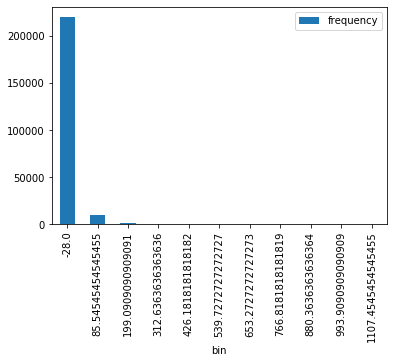

In [0]:
# Loading the Computed Histogram into a Pandas Dataframe for plotting
pd.DataFrame(
    list(zip(*delay_histogram)), 
    columns=['bin', 'frequency']
).set_index(
    'bin'
).plot(kind='bar');


# Stations

In [0]:
stations = spark.read.option("header", "true").csv("dbfs:/mnt/mids-w261/DEMO8/gsod/stations.csv.gz")

In [0]:
display(stations.describe())

summary,usaf,wban,name,country,state,call,lat,lon,elev,begin,end
count,29771,29771,28982,28833,6742,10887,28567,28566,28473,29771,29771
mean,571613.0088459856,89988.97413590406,NaN,null,null,6504.5,30.674006125949553,-3.551033956451764,344.5273416921254,1.9782414351818886E7,2.004958363887676E7
stddev,304536.39977816143,27277.1013211369,NaN,null,null,9198.752116455797,28.80919467376261,87.29020816944056,590.7682889480685,234526.86689842667,193681.5670540804
min,007018,00001,...,AA,AK,050E,-0.017,-0.005,+0000.0,19010101,19051231
max,A51256,99999,ZYRYANKA,ZI,YT,ZYYY,9.994,99.983,-0999.9,20190103,20190305


In [0]:
from pyspark.sql import functions as f
stations.where(f.col('name').contains('ATLANTA HARTSFIELD INTERNATIONAL AIRPORT, GA US'))

Out[109]: DataFrame[usaf: string, wban: string, name: string, country: string, state: string, call: string, lat: string, lon: string, elev: string, begin: string, end: string]

In [0]:
display(stations.where(f.col('call').contains('LAX')))


usaf,wban,name,country,state,call,lat,lon,elev,begin,end
999999,23174,LOS ANGELES MUNICIPAL ARPT,US,CA,KLAX,33.938,-118.389,+0099.4,19470101,19721231
722950,23174,LOS ANGELES INTERNATIONAL AIR,US,CA,KLAX,33.938,-118.389,+0029.6,19440101,20190304


In [0]:
stations.select('name').distinct().count()

Out[45]: 26497

In [0]:
display(stations.select('name').distinct())

name
HATTFJELLDAL-KRUTA
COLLAFIRTH HILL
WINDY HEAD
ST ATHAN
ARESKUTAN
RYDAL
FLASH-IN-STAFFORD
EPINAL-DOGNEVILLE
FET I EIDFJORD
SAINT LEOCADIE


In [0]:
weather.select('NAME').distinct().count()

In [0]:
display(weather.select('name').distinct())